# Project name: PY sales optimizer

# Step 2 - data preperation & first models 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [113]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.metrics import silhouette_score
import statsmodels.api
import statsmodels.formula.api as smf
from scipy import stats
from scipy.spatial.distance import cdist
from yellowbrick.cluster import SilhouetteVisualizer


from sklearn.pipeline import make_pipeline

seed = 100

#df=pd.read_csv('Pakistan Largest Ecommerce Dataset.csv')
df=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Pakistan Largest Ecommerce Dataset.csv");

In [4]:
# to remind the data format etc.
df.head()

,item_id,status,created_at,sku,price,qty_ordered,grand_total,increment_id,category_name_1,sales_commission_code,discount_amount,payment_method,Working Date,BI Status,MV,Year,Month,Customer Since,M-Y,FY,Customer ID,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25
0,211131.0,complete,7/1/2016,kreations_YI 06-L,1950.0,1.0,1950.0,100147443,Women's Fashion,\N,0.0,cod,7/1/2016,#REF!,"1,950",2016.0,7.0,2016-7,7-2016,FY17,1.0,NaN,NaN,NaN,NaN,NaN
1,211133.0,canceled,7/1/2016,kcc_Buy 2 Frey Air Freshener & Get 1 Kasual Bo...,240.0,1.0,240.0,100147444,Beauty & Grooming,\N,0.0,cod,7/1/2016,Gross,240,2016.0,7.0,2016-7,7-2016,FY17,2.0,NaN,NaN,NaN,NaN,NaN
2,211134.0,canceled,7/1/2016,Ego_UP0017-999-MR0,2450.0,1.0,2450.0,100147445,Women's Fashion,\N,0.0,cod,7/1/2016,Gross,"2,450",2016.0,7.0,2016-7,7-2016,FY17,3.0,NaN,NaN,NaN,NaN,NaN
3,211135.0,complete,7/1/2016,kcc_krone deal,360.0,1.0,60.0,100147446,Beauty & Grooming,R-FSD-52352,300.0,cod,7/1/2016,Net,360,2016.0,7.0,2016-7,7-2016,FY17,4.0,NaN,NaN,NaN,NaN,NaN
4,211136.0,order_refunded,7/1/2016,BK7010400AG,555.0,2.0,1110.0,100147447,Soghaat,\N,0.0,cod,7/1/2016,Valid,"1,110",2016.0,7.0,2016-7,7-2016,FY17,5.0,NaN,NaN,NaN,NaN,NaN


In [5]:
df.tail()

,item_id,status,created_at,sku,price,qty_ordered,grand_total,increment_id,category_name_1,sales_commission_code,discount_amount,payment_method,Working Date,BI Status,MV,Year,Month,Customer Since,M-Y,FY,Customer ID,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25
1048570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1048571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1048572,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1048573,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1048574,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 1. Cleaning as proposed in Step1



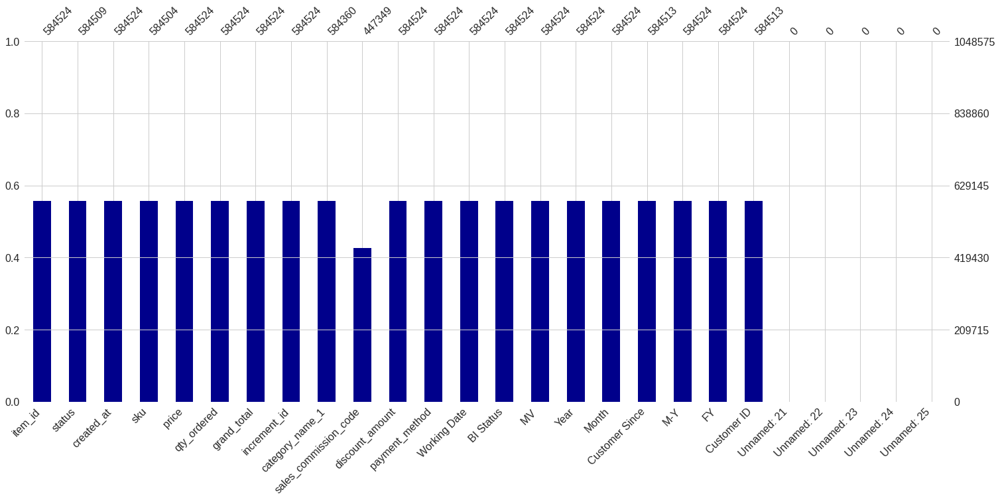

In [6]:
import missingno as msno

#display the null values per column, test this new library which was mentioned by Frederic 
msno.bar(df, color='darkblue');

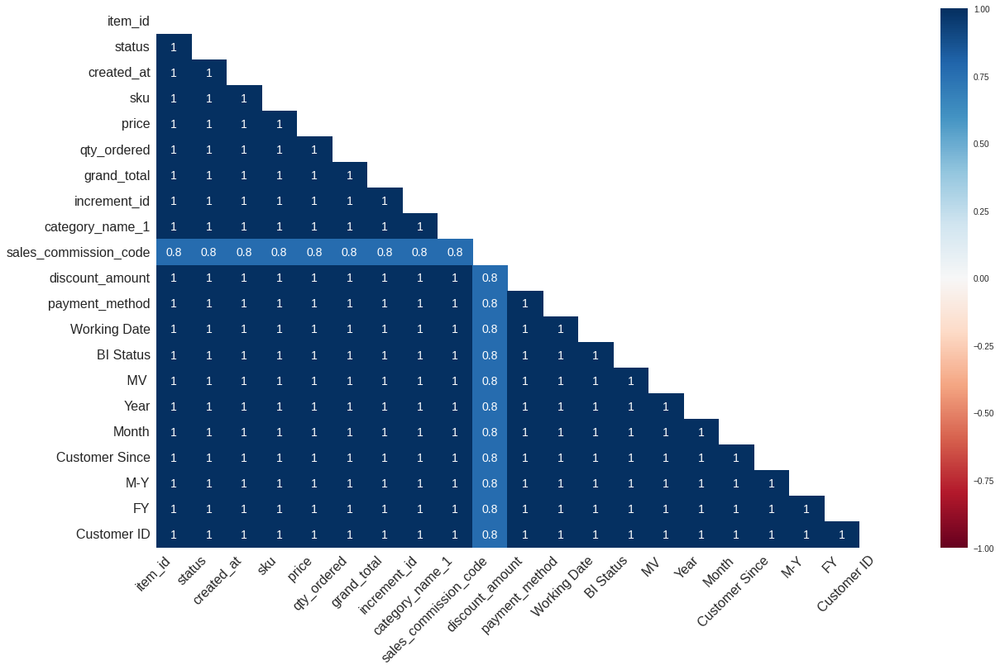

In [7]:
# heatmap to show the correlation of missing values. It supported that there exited missing values for all columns.
msno.heatmap(df);

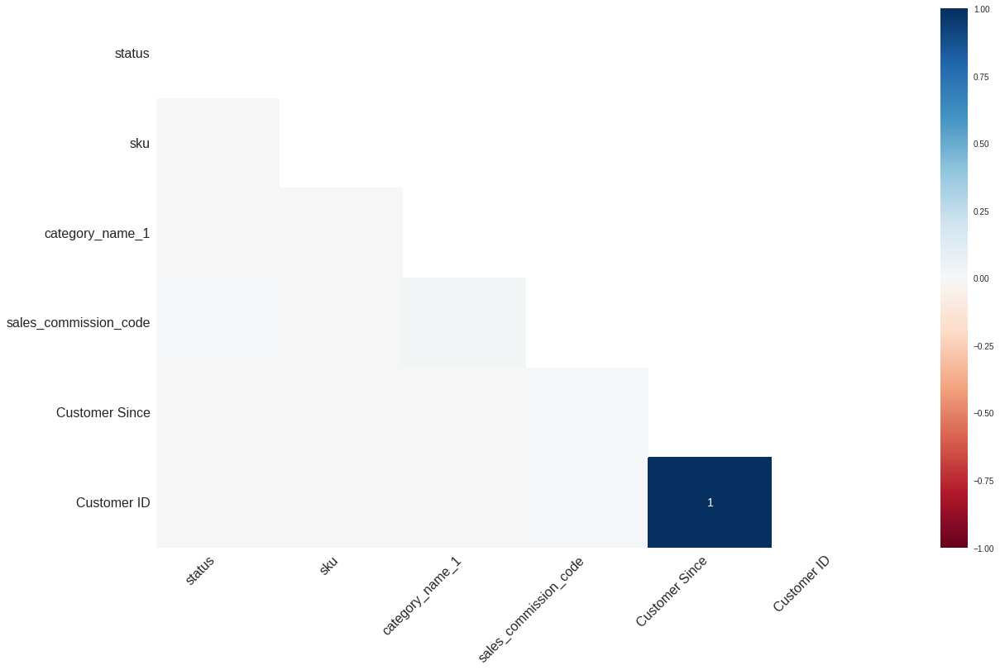

In [8]:
# remove rows and coumns all empty and show the heatmap of correlation of missing values
df.dropna(axis=0,how='all',inplace=True)
df.dropna(axis=1,how='all',inplace=True)

msno.heatmap(df);
# customer since is missing value and definitely customer id.

In [9]:
df.dropna(axis=0,how='any',inplace=True, subset=['Customer ID'])

In [10]:
# Create lifetime
print(pd.to_datetime(df['created_at']).min())
print(pd.to_datetime(df['created_at']).max())

df['Working Date2'] = pd.to_datetime(df['Working Date'])
base = df['Working Date2'].max()
df['Date'] = df['Working Date2'].apply(lambda x: x.date())
df['Customer_Since_Date'] = df.groupby('Customer ID')['Date'].transform(min)
df['Lifetime'] = (base.date() - df['Customer_Since_Date']).astype('timedelta64[D]') + 1

2016-07-01 00:00:00
2018-08-28 00:00:00


In [11]:
# Create lifetime for each customer
df[df['Customer ID'] == 12]

,item_id,status,created_at,sku,price,qty_ordered,grand_total,increment_id,category_name_1,sales_commission_code,discount_amount,payment_method,Working Date,BI Status,MV,Year,Month,Customer Since,M-Y,FY,Customer ID,Working Date2,Date,Customer_Since_Date,Lifetime
14,211146.0,complete,7/1/2016,kcc_glamour deal,320.0,1.0,0.0,100147456,Beauty & Grooming,\N,0.0,customercredit,7/1/2016,Net,320,2016.0,7.0,2016-7,7-2016,FY17,12.0,2016-07-01,2016-07-01,2016-07-01,789.0
63146,289770.0,complete,11/19/2016,AKL_A131135353-FW-56-Green,2600.0,1.0,2600.0,100200628,Women's Fashion,\N,0.0,cod,11/19/2016,Net,"2,600",2016.0,11.0,2016-7,11-2016,FY17,12.0,2016-11-19,2016-11-19,2016-07-01,789.0
63282,289938.0,complete,11/19/2016,Trzw_DUP-CHF-005-016-Black,1183.0,1.0,1183.0,100200717,Women's Fashion,\N,0.0,cod,11/19/2016,Net,"1,183",2016.0,11.0,2016-7,11-2016,FY17,12.0,2016-11-19,2016-11-19,2016-07-01,789.0


In [12]:
df = df.drop(['Working Date2', 'Date'], axis=1)

In [13]:
# df.dropna(axis=0,how='all',inplace=True)
# df.dropna(axis=1,how='all',inplace=True)

# df.dropna(axis=0,how='any',inplace=True, subset=['Customer ID'])

df["BI Status"]=df["BI Status"].replace(to_replace=['#REF!'],value=["Net"])
df['BIstatus_num'] = df['BI Status']
df['BIstatus_num'] = df['BIstatus_num'].replace(['Net'], 1)
df['BIstatus_num'] = df['BIstatus_num'].replace(['Valid'], 0)
df['BIstatus_num'] = df['BIstatus_num'].replace(['Gross'], -1)

#To be discussed 
df['status_new'] = df['status']
df['status_new'] = df['status_new'].replace(['order_refunded', 'refund'],'refunded')
df['status_new'] = df['status_new'].replace(['complete', 'closed'],'completed')
df['status_new'] = df['status_new'].replace(['paid','received','cod',"exchange"],'processing')
df['status_new'] = df['status_new'].replace(['holded','pending_paypal','payment_review'],'pending')

df['Customer Since new']=pd.to_datetime(df['Customer Since']).dt.strftime('%Y%m').astype('int')

df=df[df["price"]>0]
df=df[df["grand_total"]>0]

df['discount_rate'] = (df['discount_amount']/(df['grand_total'] + df['discount_amount']) * 100).round(2)
#only one thougt which can be discussed - different way to calculate the discount_rate
#calculate first a new grand_total, to do this use the MV colum and sum up all values which belongs to same order
#take the new_grand_total as basis to calculate the discount, new_grand_total - grand_total -> new_discount 


df['grand_item']=df['price']*df["qty_ordered"]*(1-df['discount_rate']/100)

df=df[df["category_name_1"]!='\\N']

df=df.drop(["sales_commission_code"],axis=1)

df['payment_method'].replace(['Easypay_MA','easypay_voucher'],'Easypay',inplace=True)
df['payment_method'].replace(['jazzwallet','jazzvoucher'],'Jazz',inplace=True)
df['payment_method'].replace(['customercredit','ublcreditcard'],'Credit',inplace=True)
df['payment_method'].replace(['internetbanking'],'bankalfalah',inplace=True)

df=df.dropna(axis=0,how="any")

In [14]:
df.head()

,item_id,status,created_at,sku,price,qty_ordered,grand_total,increment_id,category_name_1,discount_amount,payment_method,Working Date,BI Status,MV,Year,Month,Customer Since,M-Y,FY,Customer ID,Customer_Since_Date,Lifetime,BIstatus_num,status_new,Customer Since new,discount_rate,grand_item
0,211131.0,complete,7/1/2016,kreations_YI 06-L,1950.0,1.0,1950.0,100147443,Women's Fashion,0.0,cod,7/1/2016,Net,"1,950",2016.0,7.0,2016-7,7-2016,FY17,1.0,2016-07-01,789.0,1,completed,201607,0.00,1950.000
1,211133.0,canceled,7/1/2016,kcc_Buy 2 Frey Air Freshener & Get 1 Kasual Bo...,240.0,1.0,240.0,100147444,Beauty & Grooming,0.0,cod,7/1/2016,Gross,240,2016.0,7.0,2016-7,7-2016,FY17,2.0,2016-07-01,789.0,-1,canceled,201607,0.00,240.000
2,211134.0,canceled,7/1/2016,Ego_UP0017-999-MR0,2450.0,1.0,2450.0,100147445,Women's Fashion,0.0,cod,7/1/2016,Gross,"2,450",2016.0,7.0,2016-7,7-2016,FY17,3.0,2016-07-01,789.0,-1,canceled,201607,0.00,2450.000
3,211135.0,complete,7/1/2016,kcc_krone deal,360.0,1.0,60.0,100147446,Beauty & Grooming,300.0,cod,7/1/2016,Net,360,2016.0,7.0,2016-7,7-2016,FY17,4.0,2016-07-01,789.0,1,completed,201607,83.33,60.012
4,211136.0,order_refunded,7/1/2016,BK7010400AG,555.0,2.0,1110.0,100147447,Soghaat,0.0,cod,7/1/2016,Valid,"1,110",2016.0,7.0,2016-7,7-2016,FY17,5.0,2016-07-01,789.0,0,refunded,201607,0.00,1110.000


## 2. Analyses on discount_rates (see comment from Fred)


In [15]:
df.groupby(["increment_id"]).agg({"discount_rate":"mean","Month":np.unique,"Year":np.unique,"status_new":np.unique,'BIstatus_num':np.unique})

,discount_rate,Month,Year,status_new,BIstatus_num
increment_id,,,,,
100001290,0.00,11.0,2016.0,completed,1
100147443,0.00,7.0,2016.0,completed,1
100147444,0.00,7.0,2016.0,canceled,-1
100147445,0.00,7.0,2016.0,canceled,-1
100147446,83.33,7.0,2016.0,completed,1
...,...,...,...,...,...
100562383,0.00,8.0,2018.0,processing,0
100562384,0.00,8.0,2018.0,processing,0
100562385,0.00,8.0,2018.0,processing,0


In [16]:
Gd=df.groupby(["increment_id"]).agg({"discount_rate":"mean","Month":np.unique,"Year":np.unique,"status_new":np.unique,'BIstatus_num':np.unique})

In [17]:
# Discount levels per Month (per year)
GA=Gd[Gd["Year"]==2016.0]
vec1=[]
for i in range(7,13,1):
  calc=GA["discount_rate"][GA["Month"]==i].mean()
  vec1.append(calc)
  
GB=Gd[Gd["Year"]==2017.0]
vec2=[]
for i in range(1,13,1):
  calc=GB["discount_rate"][GB["Month"]==i].mean()
  vec2.append(calc)
  
GC=Gd[Gd["Year"]==2018.0]
vec3=[]
for i in range(1,9,1):
  calc=GC["discount_rate"][GC["Month"]==i].mean()
  vec3.append(calc)

# Share of completed transactions per Month (per year)
GA=Gd[Gd["Year"]==2016.0]
wec1=[]
for i in range(7,13,1):
  calc=len(GA[(GA["status_new"]=="completed")& (GA["Month"]==i)])/len(GA[GA["Month"]==i])
  wec1.append(calc)

GB=Gd[Gd["Year"]==2017.0]
wec2=[]
for i in range(1,13,1):
  calc=len(GB[(GB["status_new"]=="completed")& (GB["Month"]==i)])/len(GB[GB["Month"]==i])
  wec2.append(calc)

GC=Gd[Gd["Year"]==2018.0]
wec3=[]
for i in range(1,9,1):
  calc=len(GC[(GC["status_new"]=="completed")& (GC["Month"]==i)])/len(GC[GC["Month"]==i])
  wec3.append(calc)


A1=Gd["discount_rate"][Gd["Month"]==1]
A2=Gd["discount_rate"][Gd["Month"]==2]
A3=Gd["discount_rate"][Gd["Month"]==3]
A4=Gd["discount_rate"][Gd["Month"]==4]
A5=Gd["discount_rate"][Gd["Month"]==5]
A6=Gd["discount_rate"][Gd["Month"]==6]
A7=Gd["discount_rate"][Gd["Month"]==7]
A8=Gd["discount_rate"][Gd["Month"]==8]
A9=Gd["discount_rate"][Gd["Month"]==9]
A10=Gd["discount_rate"][Gd["Month"]==10]
A11=Gd["discount_rate"][Gd["Month"]==11]
A12=Gd["discount_rate"][Gd["Month"]==12]

# Status in dependency of discount_rate
Gd["l"]=pd.cut(Gd["discount_rate"],bins=[-5,0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100],
          labels=["l1","l2","l3","l4","l5","l6","l7","l8","l9","l10","l11","l12","l13","l14","l15","l16","l17","l18","l19","l20","l21"])
res=[]
for i in ["l1","l2","l3","l4","l5","l6","l7","l8","l9","l10","l11","l12","l13","l14","l15","l16","l17","l18","l19","l20","l21"]:
  a=len(Gd[(Gd["BIstatus_num"]==1)&(Gd["l"]==i)])/len(Gd[Gd["l"]==i])*100
  res.append(a)


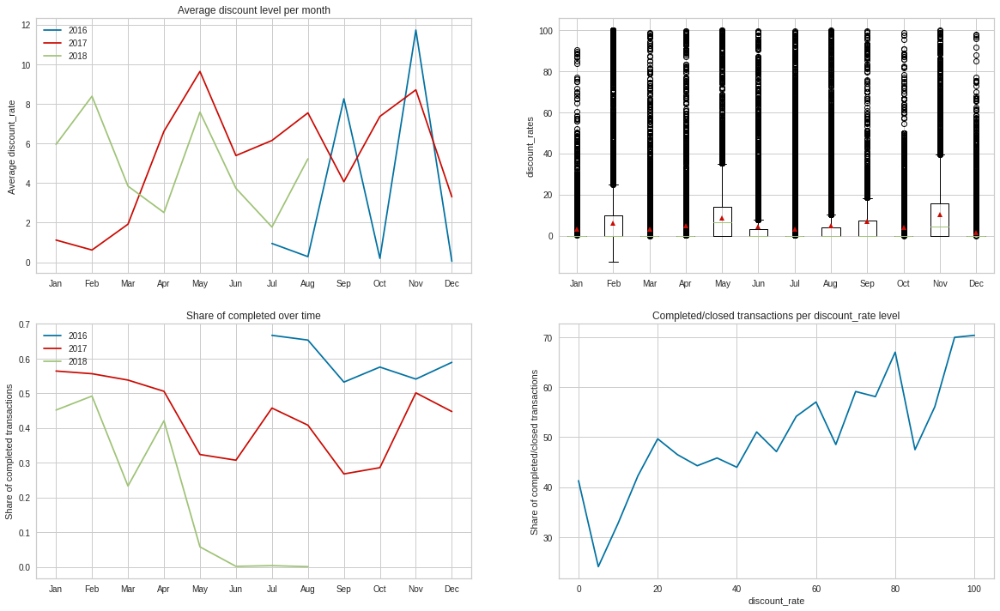

In [18]:
plt.figure(figsize=(20,12))

plt.subplot(2,2,1)
plt.plot(range(7,13),vec1,label="2016")
plt.plot(range(1,13),vec2,"r",label="2017")
plt.plot(range(1,9),vec3,"g",label="2018")
plt.legend()
plt.ylabel("Average discount_rate")
plt.title("Average discount level per month")
plt.xticks(range(1,13),["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"])

plt.subplot(2,2,3)
plt.plot(range(7,13),wec1,label="2016")
plt.plot(range(1,13),wec2,"r",label="2017")
plt.plot(range(1,9),wec3,"g",label="2018")
plt.legend()
plt.ylabel("Share of completed transactions")
plt.title("Share of completed over time")
plt.xticks(range(1,13),["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]);

plt.subplot(2,2,2)
plt.boxplot([A1,A2,A3,A4,A5,A6,A7,A8,A9,A10,A11,A12],showmeans=True)
plt.xticks(range(1,13),["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"])
plt.ylabel("discount_rates");

plt.subplot(2,2,4)
plt.plot([0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100],res)
plt.xlabel("discount_rate")
plt.ylabel("Share of completed/closed transactions")
plt.title("Completed/closed transactions per discount_rate level");

## 3. Data Pre-processing and RFM scores

In [19]:
#Only focus on positive/"promissing" transactions 
df=df[(df["status_new"]=="completed")|(df["status_new"]=="processing")]

In [20]:
print("Z score = (x-mean)/standard deviation = 3, gives 99.7% of the data points lie between +/- standard deviation. We use this statistics concept to remove outliers!")

Z score = (x-mean)/standard deviation = 3, gives 99.7% of the data points lie between +/- standard deviation. We use this statistics concept to remove outliers!


In [21]:
#Delete outliers in attributes relevant for RFM-score calculation

#Number of orders (for Frequency)
T1=df.groupby(["Customer ID"]).agg({"increment_id":"count"})
m1=T1["increment_id"].mean()
s1=T1["increment_id"].std()
A1=T1[T1["increment_id"]<=m1+3*s1]
a1=A1.index
lis=[]
for id in df["Customer ID"]:
  lis.append(id in a1)

df1=df.iloc[lis]


# price, qty_ordered, discount_rate (for Monetary)
zpmax=df["price"].mean()+3*df["price"].std()
zpmin=df["price"].mean()-3*df["price"].std()
data=df1[(df1["price"]>=zpmin) & (df1["price"]<=zpmax)]

zqmax=data["qty_ordered"].mean()+3*data["qty_ordered"].std()
zqmin=data["qty_ordered"].mean()-3*data["qty_ordered"].std()
data=data[(data["qty_ordered"]>=zqmin) & (data["qty_ordered"]<=zqmax)]

zdmax=data["discount_rate"].mean()+3*data["discount_rate"].std()
zdmin=data["discount_rate"].mean()-3*data["discount_rate"].std()
data=data[(data["discount_rate"]>=zdmin) & (data["discount_rate"]<=zdmax)]


In [22]:
# Calculate RFM-scores:

# Recency: Days since last purchase

data['Working Date'] = pd.to_datetime(data['Working Date'])
base = data['Working Date'].max()
data['Date'] = data['Working Date'].apply(lambda x: x.date())
data['Most_Recent_Purchase'] = data.groupby('Customer ID')['Date'].transform(max)
data['Recency'] = (base.date() - data['Most_Recent_Purchase']).astype('timedelta64[D]')

# Frequency: Total number of purchases
data['Frequency'] = data.groupby('Customer ID')['increment_id'].transform('nunique')

# Monetary: Total amount spend
data['Monetary'] = data.groupby('Customer ID')['grand_item'].transform('sum')

#RFM table
RFM_abs= data[['Customer ID', 'Recency', 'Frequency', 'Monetary']].drop_duplicates()
RFM_abs.head()

,Customer ID,Recency,Frequency,Monetary
0,1.0,788.0,1,1950.0
7,6.0,788.0,1,170.0
10,9.0,788.0,1,5500.0
11,10.0,788.0,1,366.0
13,11.0,560.0,4,945.0


         Customer ID       Recency     Frequency      Monetary
count   75793.000000  75793.000000  75793.000000  7.579300e+04
mean    55115.681277    367.021084      2.078279  1.036687e+04
std     32888.702151    206.127769      2.865287  2.835060e+04
min         1.000000      0.000000      1.000000  1.000000e+00
25%     26522.000000    186.000000      1.000000  9.600000e+02
50%     54372.000000    313.000000      1.000000  2.196000e+03
75%     82770.000000    548.000000      2.000000  8.052805e+03
max    115325.000000    788.000000     59.000000  1.018850e+06


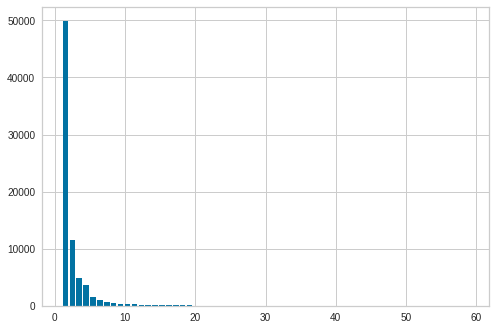

In [23]:
print(RFM_abs.describe())

plt.hist(RFM_abs["Frequency"],rwidth=0.8, bins=59);

In [24]:
RFM_score=RFM_abs.copy()
RFM_score["Recency"]=pd.qcut(RFM_score["Recency"],5,labels=[5,4,3,2,1])
RFM_score["Frequency"]=pd.cut(RFM_score["Frequency"],bins=[0,1,3,5,10,60],labels=[1,2,3,4,5])
RFM_score["Monetary"]=pd.qcut(RFM_score["Monetary"],5,labels=[1,2,3,4,5])

In [25]:
RFM_score

,Customer ID,Recency,Frequency,Monetary
0,1.0,1,1,3
7,6.0,1,1,1
10,9.0,1,1,4
11,10.0,1,1,1
13,11.0,2,3,2
...,...,...,...,...
584488,110259.0,5,1,2
584496,115322.0,5,1,2
584509,115324.0,5,1,1
584517,115325.0,5,2,2


In [26]:
# RFM_rel table
data['Frequency_rel'] = data['Frequency'] / (data['Lifetime']) * 100
# data.head()

RFM_rel= data[['Customer ID', 'Recency', 'Frequency_rel', 'Monetary']].drop_duplicates()
RFM_rel.index = RFM_rel['Customer ID']
RFM_rel = RFM_rel.drop('Customer ID', axis=1)
RFM_rel.head()

,Recency,Frequency_rel,Monetary
Customer ID,,,
1.0,788.0,0.126743,1950.0
6.0,788.0,0.126743,170.0
9.0,788.0,0.126743,5500.0
10.0,788.0,0.126743,366.0
11.0,560.0,0.506971,945.0


In [27]:
RFM_rel.tail()

,Recency,Frequency_rel,Monetary
Customer ID,,,
110259.0,0.0,1.136364,798.0
115322.0,0.0,100.000000,1048.0
115324.0,0.0,100.000000,399.0
115325.0,0.0,200.000000,899.0
115320.0,0.0,100.000000,699.0


In [28]:
# Create lifetime for each customer
data[data['Customer ID'] == 115325.0]

,item_id,status,created_at,sku,price,qty_ordered,grand_total,increment_id,category_name_1,discount_amount,payment_method,Working Date,BI Status,MV,Year,Month,Customer Since,M-Y,FY,Customer ID,Customer_Since_Date,Lifetime,BIstatus_num,status_new,Customer Since new,discount_rate,grand_item,Date,Most_Recent_Purchase,Recency,Frequency,Monetary,Frequency_rel
584517,905200.0,cod,8/28/2018,WOFVAL59D5EA84167F9-M,400.0,1.0,550.0,100562383,Women's Fashion,0.0,cod,2018-08-28,Valid,400,2018.0,8.0,2018-8,8-2018,FY19,115325.0,2018-08-28,1.0,0,processing,201808,0.0,400.0,2018-08-28,2018-08-28,0.0,2,899.0,200.0
584518,905202.0,cod,8/28/2018,WOFNIG5B4D7EB0E9FDD-L,499.0,1.0,649.0,100562384,Women's Fashion,0.0,cod,2018-08-28,Valid,499,2018.0,8.0,2018-8,8-2018,FY19,115325.0,2018-08-28,1.0,0,processing,201808,0.0,499.0,2018-08-28,2018-08-28,0.0,2,899.0,200.0


In [29]:
print(RFM_rel.describe())

            Recency  Frequency_rel      Monetary
count  75793.000000   75793.000000  7.579300e+04
mean     367.021084       0.817088  1.036687e+04
std      206.127769       2.518944  2.835060e+04
min        0.000000       0.126743  1.000000e+00
25%      186.000000       0.203252  9.600000e+02
50%      313.000000       0.359712  2.196000e+03
75%      548.000000       0.706714  8.052805e+03
max      788.000000     200.000000  1.018850e+06


In [30]:
# z-score to remove outliers that recent customers (low in recency), with high in frequency
Frequency_rel_mean = RFM_rel['Frequency_rel'].mean()
print(Frequency_rel_mean)
Frequency_rel_std = RFM_rel['Frequency_rel'].std()
print(Frequency_rel_std)
RFM_rel = RFM_rel[RFM_rel["Frequency_rel"]<=Frequency_rel_mean+3*Frequency_rel_std]
print(RFM_rel.shape)

0.8170875138695296
2.518943946053148
(75264, 3)


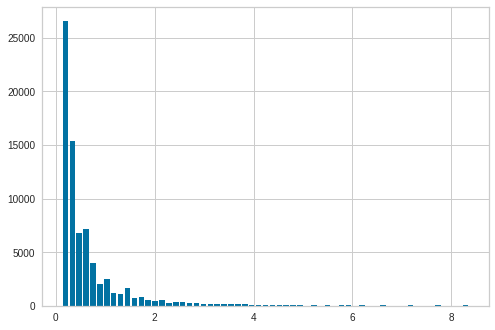

In [31]:
plt.hist(RFM_rel["Frequency_rel"],rwidth=0.8, bins=59);

In [32]:
print(RFM_abs.shape)
print("Drop observations between abs and rel tables: ", RFM_abs.shape[0] - RFM_rel.shape[0])

(75793, 4)
Drop observations between abs and rel tables:  529


In [33]:
RFM_rel_score=RFM_rel.copy()
RFM_rel_score["Recency"]=pd.qcut(RFM_rel_score["Recency"],5,labels=[5,4,3,2,1])
RFM_rel_score["Frequency_rel"]=pd.qcut(RFM_rel_score["Frequency_rel"],5,labels=[1,2,3,4,5])
RFM_rel_score["Monetary"]=pd.qcut(RFM_rel_score["Monetary"],5,labels=[1,2,3,4,5])


RFM_rel_score["RFM_Rel_Score"] = RFM_rel_score["Recency"].astype(str) + RFM_rel_score["Frequency_rel"].astype(str) + RFM_rel_score["Monetary"].astype(str)

print("The best group should be '555', where Recency low = 5, Frequency high = 5, Monetary high = 5")
RFM_rel_score.head()

The best group should be '555', where Recency low = 5, Frequency high = 5, Monetary high = 5


,Recency,Frequency_rel,Monetary,RFM_Rel_Score
Customer ID,,,,
1.0,1,1,3,113
6.0,1,1,1,111
9.0,1,1,4,114
10.0,1,1,1,111
11.0,2,4,2,242


In [34]:
RFM_rel_score.tail()

,Recency,Frequency_rel,Monetary,RFM_Rel_Score
Customer ID,,,,
28829.0,5,1,1,511
111546.0,5,5,2,552
111664.0,5,5,3,553
91249.0,5,4,4,544
110259.0,5,5,2,552


In [35]:
# Example of difference between absolute and relative frequency in RFM scores
RFM_score[RFM_score['Customer ID'] == 110259.0]

,Customer ID,Recency,Frequency,Monetary
584488,110259.0,5,1,2


## 4. Baseline Model: K Means 

### 4.1. Model 1: K-Means on RFM values

In [114]:
# Scale the data between 0 and 1
# To be discussed: which is the best scaler to use here?, MinMax or Standard or a different one? 
RFM=RFM_abs.copy().drop(["Customer ID"],axis=1)
scaler=preprocessing.MinMaxScaler().fit(RFM)
RFM=scaler.transform(RFM)

**Elbow method**: find the best K

In [38]:
range_n_cluster = [2,3,4,5,6,7,8,9,10,11,12]
ssd = []
distortions = []
for i in range_n_cluster:
    kmeans = KMeans(n_clusters = i, random_state=seed)
    kmeans.fit(RFM)
    ssd.append(kmeans.inertia_)
    distortions.append(sum(np.min(cdist(RFM, kmeans.cluster_centers_, 'euclidean'), axis=1)) / np.size(RFM, axis = 0))

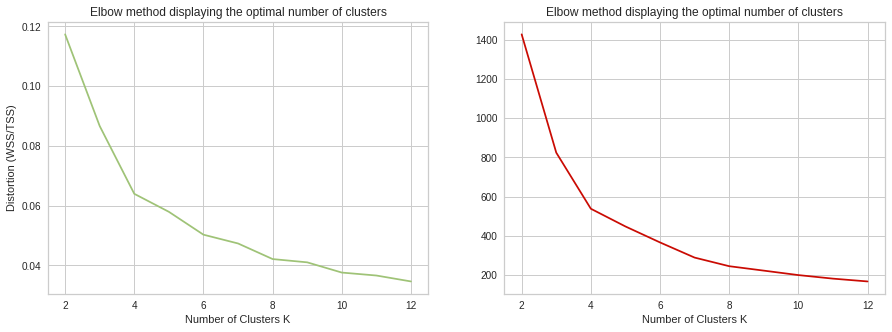

In [39]:
# Plotting the distortion as a function of the number of clusters
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(range_n_cluster, distortions, 'gx-')
plt.xlabel('Number of Clusters K')
plt.ylabel('Distortion (WSS/TSS)')
plt.title('Elbow method displaying the optimal number of clusters');

plt.subplot(1,2,2)
plt.plot(range_n_cluster, ssd, 'rx-')
plt.xlabel('Number of Clusters K')
plt.title('Elbow method displaying the optimal number of clusters');

# similar results, let's pick 1, either the Distortion or SSD measure.

Oberseration:
Based on elbow method, as resulting curve decreases sharply and slow down after k = 4. **Optimal number of clusters is 4**

**Silhouette analysis**: use Silhouette plots to confirm optimal K

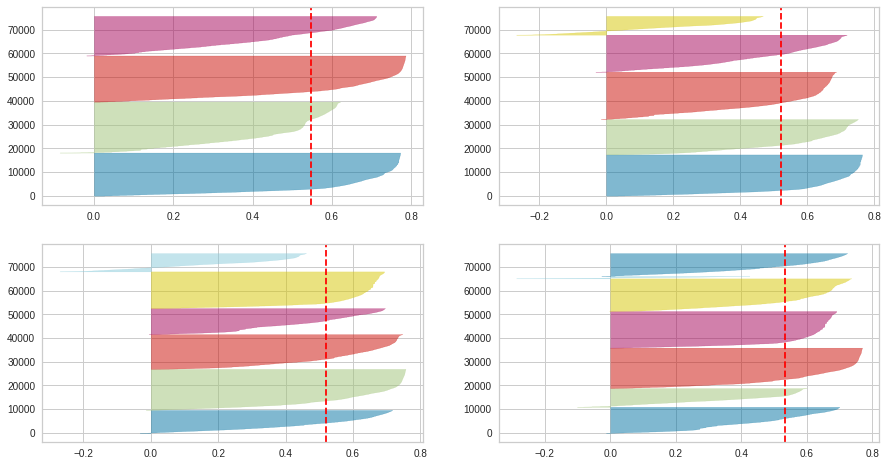

In [40]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [4, 5, 6, 7]:
    km = KMeans(n_clusters = i, n_init=10, max_iter=100, random_state=seed)
    q, mod = divmod(i, 2)
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-2][mod])
    visualizer.fit(RFM)

# note: this step takes about 30mins

Obseration:
- The silhouette score for each cluster is above average silhouette scores. 
- Also, the fluctuation in size is similar. 
- For the plot with n_cluster 4 (top left), the thickness is more uniform than the plot with n_cluster 5 (top right) with one cluster thickness much more than the other. 
- Thus, based on silouette analysis, the **optimal number of clusters is 4**.

**Train the model with optimal K**

In [116]:
kmeans=KMeans(n_clusters=4, random_state = seed)
kmeans.fit(RFM)
#silhouette_score(RFM,kmeans.labels_,metric="sqeuclidean")

KMeans(n_clusters=4, random_state=100)

In [117]:
# add now the predicted cluster to the RFM table
RFM_res = RFM_abs.copy()
RFM_res['Cluster1'] = kmeans.labels_
RFM_res.head()

,Customer ID,Recency,Frequency,Monetary,Cluster1
0,1.0,788.0,1,1950.0,0
7,6.0,788.0,1,170.0,0
10,9.0,788.0,1,5500.0,0
11,10.0,788.0,1,366.0,0
13,11.0,560.0,4,945.0,2


### 4.2. Model 2: K-Means on RFM scores

In [118]:
# Scale the data between 0 and 1
RFM=RFM_score.copy().drop(["Customer ID"],axis=1)
scaler=preprocessing.MinMaxScaler().fit(RFM)
RFM=scaler.transform(RFM)

**Elbow method**: find the best K

In [44]:
range_n_cluster = [2,3,4,5,6,7,8,9,10,11,12]
ssd = []
distortions = []
for i in range_n_cluster:
    kmeans = KMeans(n_clusters = i, random_state = seed)
    kmeans.fit(RFM)
    ssd.append(kmeans.inertia_)
    distortions.append(sum(np.min(cdist(RFM, kmeans.cluster_centers_, 'euclidean'), axis=1)) / np.size(RFM, axis = 0))

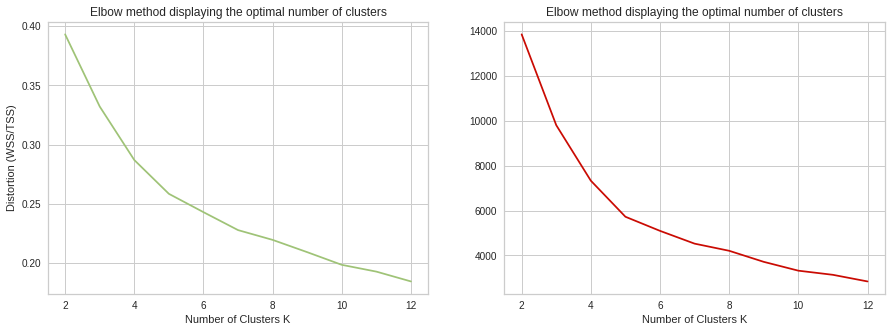

In [45]:
# Plotting the distortion as a function of the number of clusters
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(range_n_cluster, distortions, 'gx-')
plt.xlabel('Number of Clusters K')
plt.ylabel('Distortion (WSS/TSS)')
plt.title('Elbow method displaying the optimal number of clusters');

plt.subplot(1,2,2)
plt.plot(range_n_cluster, ssd, 'rx-')
plt.xlabel('Number of Clusters K')
plt.title('Elbow method displaying the optimal number of clusters');

# similar results, let's pick 1, either the Distortion or SSD measure.

Oberseration:
Based on elbow method, as resulting curve decreases sharply and slow down after k = 5. **Optimal number of clusters is 5**

**Silhouette analysis**: use Silhouette plots to confirm optimal K

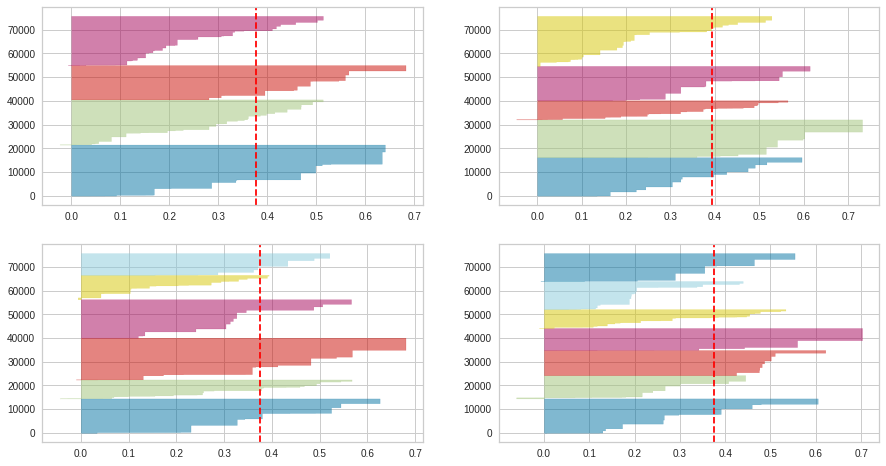

In [46]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [4, 5, 6, 7]:
    km = KMeans(n_clusters = i, n_init=10, max_iter=100, random_state = seed)
    q, mod = divmod(i, 2)
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-2][mod])
    visualizer.fit(RFM)

# note: this step takes about 30mins

Obseration:
- The silhouette score for each cluster is above average silhouette scores. 
- Also, the fluctuation in size is similar. 
- For the plot with n_cluster 4 (top left), the thickness is more uniform than the plot with n_cluster 5 (top right) with one cluster thickness much more than the other. 
- Thus, based on silouette analysis, the **optimal number of clusters is 4**.

**Train the model with optimal K**

In [121]:
kmeans=KMeans(n_clusters=4, random_state=seed)
kmeans.fit(RFM)
#silhouette_score(RFM,kmeans.labels_,metric="sqeuclidean")

KMeans(n_clusters=4, random_state=100)

In [122]:
# add now the predicted cluster to the RFM table
RFM_res = RFM_res.copy()
RFM_res['Cluster2'] = kmeans.labels_
RFM_res.head()

,Customer ID,Recency,Frequency,Monetary,Cluster1,Cluster2
0,1.0,788.0,1,1950.0,0,0
7,6.0,788.0,1,170.0,0,1
10,9.0,788.0,1,5500.0,0,0
11,10.0,788.0,1,366.0,0,1
13,11.0,560.0,4,945.0,2,1


### 4.3. Model 3: K-Means on RFM relative frequency - no standardise data

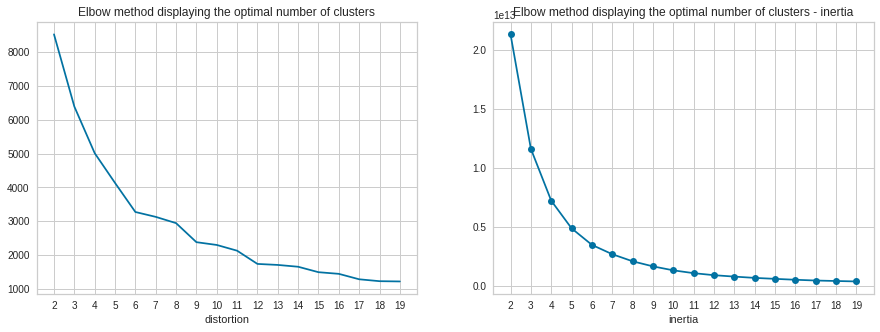

In [123]:
range_n_cluster = range(2,20)
ssd = []
distortions = []

for i in range_n_cluster:
    kmeans = KMeans(n_clusters = i, random_state = seed)
    pipeline = make_pipeline(kmeans)
    pipeline.fit(RFM_rel)

    ssd.append(kmeans.inertia_)
    distortions.append(sum(np.min(cdist(RFM_rel, kmeans.cluster_centers_, 'euclidean'), axis=1)) / np.size(RFM_rel, axis = 0))

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(range_n_cluster, distortions, '-x')
plt.xlabel('number of clusters, k')
plt.xlabel('distortion')
plt.xticks(range_n_cluster)
plt.title('Elbow method displaying the optimal number of clusters');

plt.subplot(1,2,2)
plt.plot(range_n_cluster, ssd, '-o')
plt.xlabel('number of clusters, k')
plt.xlabel('inertia')
plt.xticks(range_n_cluster)
plt.title('Elbow method displaying the optimal number of clusters - inertia');
plt.show();



In [127]:
# Fit best number of clusters
kmeans = KMeans(n_clusters = 4, random_state = seed)
pipeline = make_pipeline(kmeans)
pipeline.fit(RFM_rel)

predicts = pipeline.predict(RFM_rel)
RFM_rel_group = RFM_rel_score['RFM_Rel_Score']
outcome = pd.DataFrame({'predicts': predicts, 'RFM_rel_group': RFM_rel_group})

In [128]:
RFM_rel_pred3 = pd.crosstab(outcome['RFM_rel_group'], outcome['predicts'])
RFM_rel_pred3.columns = ['M3_0', 'M3_1', 'M3_2', 'M3_3']
RFM_rel_pred3.head(125)

,M3_0,M3_1,M3_2,M3_3
RFM_rel_group,,,,
111,5105,0,0,0
112,2873,0,0,0
113,1677,0,0,0
114,1111,0,0,0
115,640,0,273,1
...,...,...,...,...
551,935,0,0,0
552,1068,0,0,0
553,1232,0,0,0


Observations: Model 3 allocates best group 555 into all 4 clusters.

In [129]:
# add now the predicted cluster to the RFM table
RFM_rel_res = RFM_rel.copy()
RFM_rel_res['Cluster3'] = kmeans.labels_
RFM_rel_res.head()

,Recency,Frequency_rel,Monetary,Cluster3
Customer ID,,,,
1.0,788.0,0.126743,1950.0,0
6.0,788.0,0.126743,170.0,0
9.0,788.0,0.126743,5500.0,0
10.0,788.0,0.126743,366.0,0
11.0,560.0,0.506971,945.0,0


In [130]:
RFM_rel_res.tail()

,Recency,Frequency_rel,Monetary,Cluster3
Customer ID,,,,
28829.0,1.0,0.160772,450.0,0
111546.0,1.0,1.492537,967.0,0
111664.0,1.0,1.538462,1600.0,0
91249.0,0.0,0.540541,5680.0,0
110259.0,0.0,1.136364,798.0,0


### 4.4. Model 4: K-Means on RFM relative frequency - standardise data

In [131]:
# from sklearn.preprocessing import StandardScaler


# scaler = preprocessing.MinMaxScaler()
scaler = preprocessing.StandardScaler()

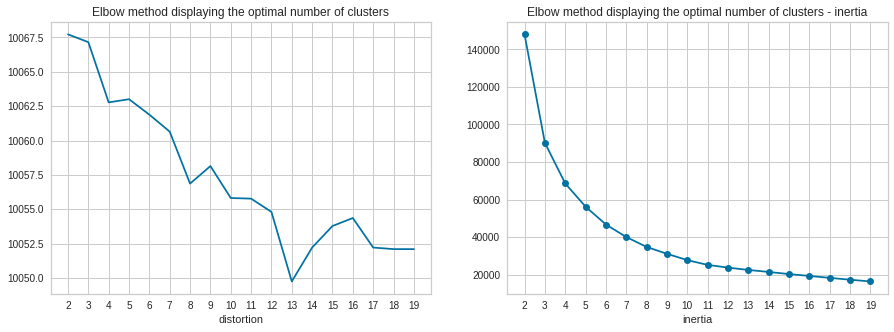

In [132]:
range_n_cluster = range(2,20)
ssd = []
distortions = []

for i in range_n_cluster:
    kmeans = KMeans(n_clusters = i, random_state = seed)
    pipeline = make_pipeline(scaler, kmeans)
    pipeline.fit(RFM_rel)

    ssd.append(kmeans.inertia_)
    distortions.append(sum(np.min(cdist(RFM_rel, kmeans.cluster_centers_, 'euclidean'), axis=1)) / np.size(RFM_rel, axis = 0))

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(range_n_cluster, distortions, '-x')
plt.xlabel('number of clusters, k')
plt.xlabel('distortion')
plt.xticks(range_n_cluster)
plt.title('Elbow method displaying the optimal number of clusters');

plt.subplot(1,2,2)
plt.plot(range_n_cluster, ssd, '-o')
plt.xlabel('number of clusters, k')
plt.xlabel('inertia')
plt.xticks(range_n_cluster)
plt.title('Elbow method displaying the optimal number of clusters - inertia');
plt.show();



In [135]:
# Fit best number of clusters
kmeans = KMeans(n_clusters = 4, random_state = seed)
pipeline = make_pipeline(scaler, kmeans)
pipeline.fit(RFM_rel)

predicts = pipeline.predict(RFM_rel)
RFM_rel_group = RFM_rel_score['RFM_Rel_Score']
outcome = pd.DataFrame({'predicts': predicts, 'RFM_rel_group': RFM_rel_group})

In [136]:
RFM_rel_pred4 = pd.crosstab(outcome['RFM_rel_group'], outcome['predicts'])
RFM_rel_pred4.columns = ['M4_0', 'M4_1', 'M4_2', 'M4_3']
RFM_rel_pred4.head(125)

,M4_0,M4_1,M4_2,M4_3
RFM_rel_group,,,,
111,5105,0,0,0
112,2873,0,0,0
113,1677,0,0,0
114,1111,0,0,0
115,914,0,0,0
...,...,...,...,...
551,0,249,0,686
552,0,256,0,812
553,0,291,0,941


In [137]:

RFM_rel_pred = pd.merge(RFM_rel_pred3, RFM_rel_pred4, on='RFM_rel_group')
RFM_rel_pred.head(125)

,M3_0,M3_1,M3_2,M3_3,M4_0,M4_1,M4_2,M4_3
RFM_rel_group,,,,,,,,
111,5105,0,0,0,5105,0,0,0
112,2873,0,0,0,2873,0,0,0
113,1677,0,0,0,1677,0,0,0
114,1111,0,0,0,1111,0,0,0
115,640,0,273,1,914,0,0,0
...,...,...,...,...,...,...,...,...
551,935,0,0,0,0,249,0,686
552,1068,0,0,0,0,256,0,812
553,1232,0,0,0,0,291,0,941


In [138]:
# add now the predicted cluster to the RFM table
RFM_rel_res = RFM_rel_res.copy()
RFM_rel_res['Cluster4'] = kmeans.labels_
RFM_rel_res.head()

,Recency,Frequency_rel,Monetary,Cluster3,Cluster4
Customer ID,,,,,
1.0,788.0,0.126743,1950.0,0,0
6.0,788.0,0.126743,170.0,0,0
9.0,788.0,0.126743,5500.0,0,0
10.0,788.0,0.126743,366.0,0,0
11.0,560.0,0.506971,945.0,0,0


In [139]:
RFM_rel_res.tail()

,Recency,Frequency_rel,Monetary,Cluster3,Cluster4
Customer ID,,,,,
28829.0,1.0,0.160772,450.0,0,3
111546.0,1.0,1.492537,967.0,0,3
111664.0,1.0,1.538462,1600.0,0,3
91249.0,0.0,0.540541,5680.0,0,3
110259.0,0.0,1.136364,798.0,0,3


### 4.5. Model 5: K-Means on RFM relative frequency - standardised - remove best group 555


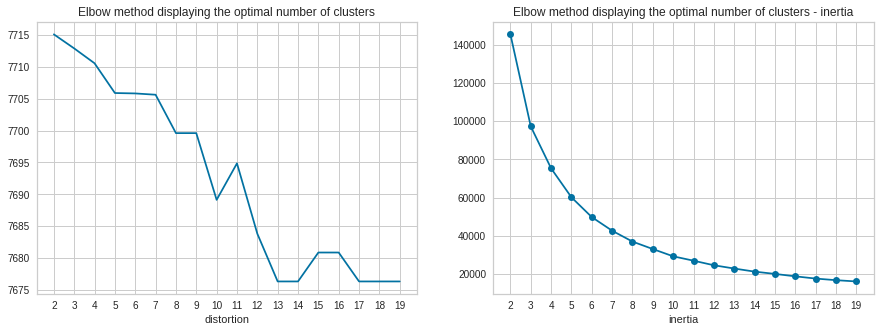

In [140]:
RFM_rel_excl555 = RFM_rel[RFM_rel_score['RFM_Rel_Score'] != '555']

range_n_cluster = range(2,20)
ssd = []
distortions = []

for i in range_n_cluster:
    kmeans = KMeans(n_clusters = i, random_state = seed)
    pipeline = make_pipeline(scaler, kmeans)
    pipeline.fit(RFM_rel_excl555)

    ssd.append(kmeans.inertia_)
    distortions.append(sum(np.min(cdist(RFM_rel_excl555, kmeans.cluster_centers_, 'euclidean'), axis=1)) / np.size(RFM_rel_excl555, axis = 0))

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(range_n_cluster, distortions, '-x')
plt.xlabel('number of clusters, k')
plt.xlabel('distortion')
plt.xticks(range_n_cluster)
plt.title('Elbow method displaying the optimal number of clusters');

plt.subplot(1,2,2)
plt.plot(range_n_cluster, ssd, '-o')
plt.xlabel('number of clusters, k')
plt.xlabel('inertia')
plt.xticks(range_n_cluster)
plt.title('Elbow method displaying the optimal number of clusters - inertia');
plt.show();



In [141]:
# Fit best number of clusters
kmeans = KMeans(n_clusters = 4, random_state = seed)
pipeline = make_pipeline(scaler, kmeans)
pipeline.fit(RFM_rel_excl555)

predicts = pipeline.predict(RFM_rel_excl555)
RFM_rel_group = RFM_rel_score['RFM_Rel_Score'][RFM_rel_score['RFM_Rel_Score'] != '555']

outcome = pd.DataFrame({'predicts': predicts, 'RFM_rel_group': RFM_rel_group})

In [142]:
RFM_rel_pred5 = pd.crosstab(outcome['RFM_rel_group'], outcome['predicts'])
RFM_rel_pred5.columns = ['M5_0', 'M5_1', 'M5_2', 'M5_3']
RFM_rel_pred5.head(125)

,M5_0,M5_1,M5_2,M5_3
RFM_rel_group,,,,
111,5105,0,0,0
112,2873,0,0,0
113,1677,0,0,0
114,1111,0,0,0
115,913,0,0,1
...,...,...,...,...
545,0,944,0,10
551,0,695,240,0
552,0,826,242,0


In [143]:
RFM_rel_pred = pd.merge(RFM_rel_pred, RFM_rel_pred5, on='RFM_rel_group')
RFM_rel_pred.head(125)

,M3_0,M3_1,M3_2,M3_3,M4_0,M4_1,M4_2,M4_3,M5_0,M5_1,M5_2,M5_3
RFM_rel_group,,,,,,,,,,,,
111,5105,0,0,0,5105,0,0,0,5105,0,0,0
112,2873,0,0,0,2873,0,0,0,2873,0,0,0
113,1677,0,0,0,1677,0,0,0,1677,0,0,0
114,1111,0,0,0,1111,0,0,0,1111,0,0,0
115,640,0,273,1,914,0,0,0,913,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
545,502,1,446,5,0,3,2,949,0,944,0,10
551,935,0,0,0,0,249,0,686,0,695,240,0
552,1068,0,0,0,0,256,0,812,0,826,242,0


In [144]:
# add now the predicted cluster to the RFM table
RFM_rel_res5 = RFM_rel_excl555.copy()
RFM_rel_res5['Cluster5'] = kmeans.labels_
RFM_rel_res5.head()

,Recency,Frequency_rel,Monetary,Cluster5
Customer ID,,,,
1.0,788.0,0.126743,1950.0,0
6.0,788.0,0.126743,170.0,0
9.0,788.0,0.126743,5500.0,0
10.0,788.0,0.126743,366.0,0
11.0,560.0,0.506971,945.0,0


## 5. Model result interpretation

In [ ]:
# add now the predicted cluster to the RFM table
#RFM_res = RFM_abs.copy()
#RFM_res['Cluster'] = kmeans.labels_

In [145]:
# Result table on RFM Values, contains cluster 1 and cluster 2
RFM_res

,Customer ID,Recency,Frequency,Monetary,Cluster1,Cluster2
0,1.0,788.0,1,1950.0,0,0
7,6.0,788.0,1,170.0,0,1
10,9.0,788.0,1,5500.0,0,0
11,10.0,788.0,1,366.0,0,1
13,11.0,560.0,4,945.0,2,1
...,...,...,...,...,...,...
584488,110259.0,0.0,1,798.0,1,3
584496,115322.0,0.0,1,1048.0,1,3
584509,115324.0,0.0,1,399.0,1,3
584517,115325.0,0.0,2,899.0,1,3


Customers are now divided into 4 groups
Visualize now the clusters of first two models
start with recency analysis

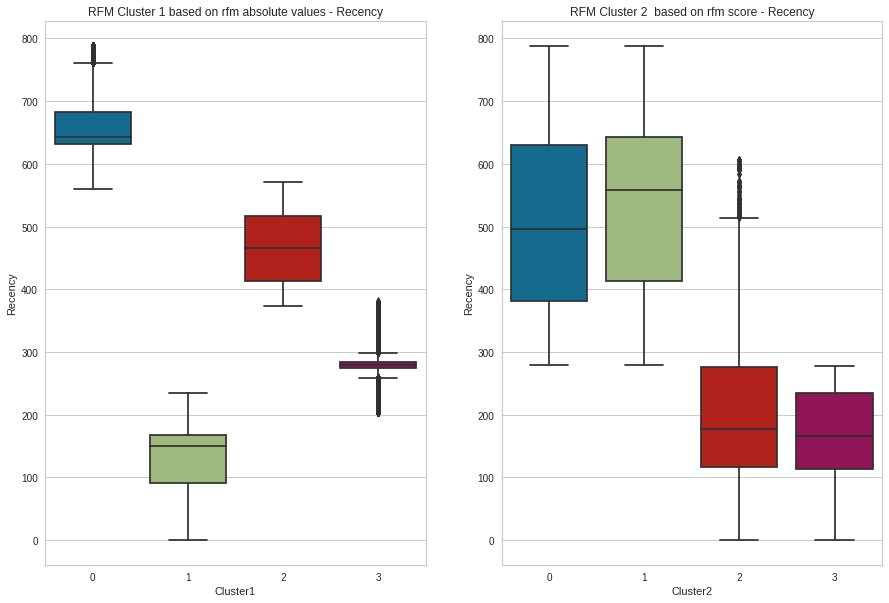

In [146]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
sns.boxplot(x = 'Cluster1', y='Recency', data=RFM_res)

plt.ylabel('Recency')
plt.title('RFM Cluster 1 based on rfm absolute values - Recency')
/

plt.subplot(1,2,2)
sns.boxplot(x = 'Cluster2', y='Recency', data=RFM_res)

plt.ylabel('Recency')
plt.title('RFM Cluster 2  based on rfm score - Recency')
plt.show()

Observation:
The higher the (Recency) value, the less often the shop was visited. 
In this case, Cluster 1 & 2 are the groups that haven't visited the online shop for a long time.  
Cluster **0 and 1** are the groups which have visited the shop recently.


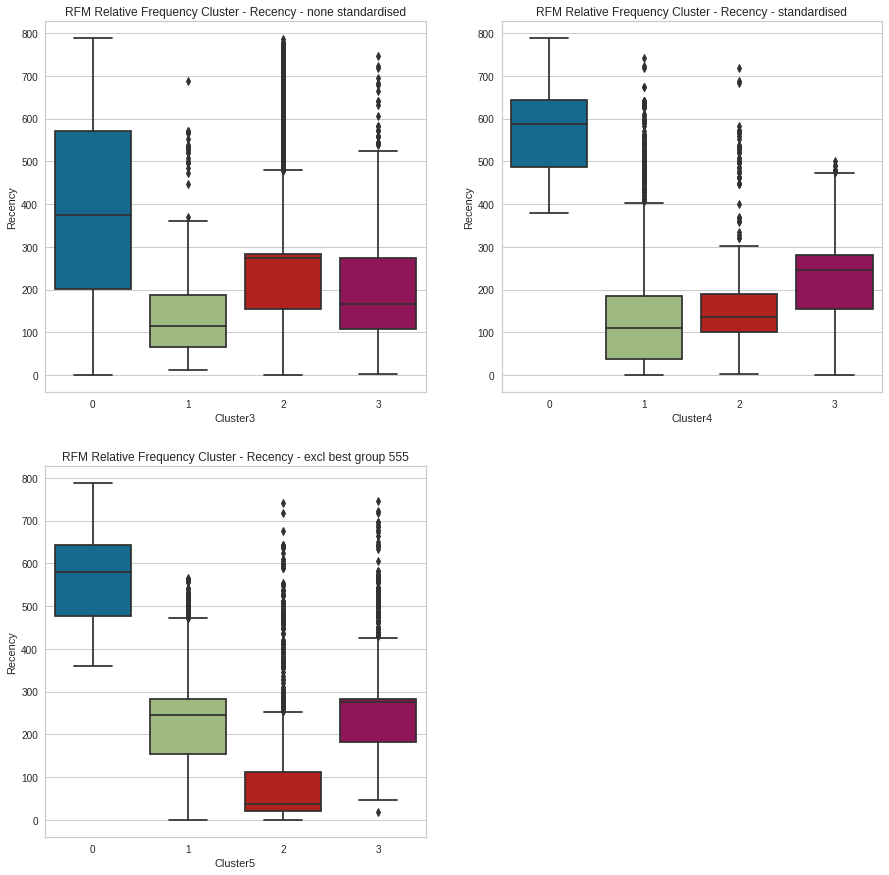

In [155]:
# use relative freequency model
plt.figure(figsize=(15,15))
plt.subplot(221)
sns.boxplot(x = 'Cluster3', y='Recency', data=RFM_rel_res)

plt.ylabel('Recency')
plt.title('RFM Relative Frequency Cluster - Recency - none standardised')

plt.subplot(222)
sns.boxplot(x = 'Cluster4', y='Recency', data=RFM_rel_res)

plt.ylabel('Recency')
plt.title('RFM Relative Frequency Cluster - Recency - standardised')

plt.subplot(223)
sns.boxplot(x = 'Cluster5', y='Recency', data=RFM_rel_res5)

plt.ylabel('Recency')
plt.title('RFM Relative Frequency Cluster - Recency - excl best group 555')
plt.show();

**Check in the next Step distribution of FREQUENCY**

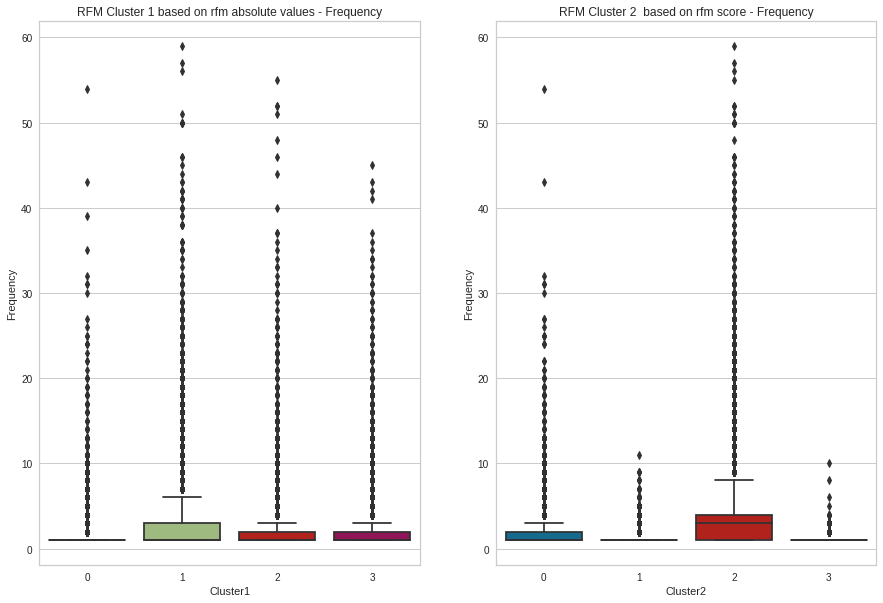

In [156]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
sns.boxplot(x = 'Cluster1', y='Frequency', data=RFM_res)

plt.ylabel('Frequency')
plt.title('RFM Cluster 1 based on rfm absolute values - Frequency')
/

plt.subplot(1,2,2)
sns.boxplot(x = 'Cluster2', y='Frequency', data=RFM_res)

plt.ylabel('Frequency')
plt.title('RFM Cluster 2  based on rfm score - Frequency')
plt.show()


Observation:

Model 1 on Absolute RFM -> Cluster 3 contains the most frequent customers

Model 2 on frm score -> cluster 0 contains the most frequent customers

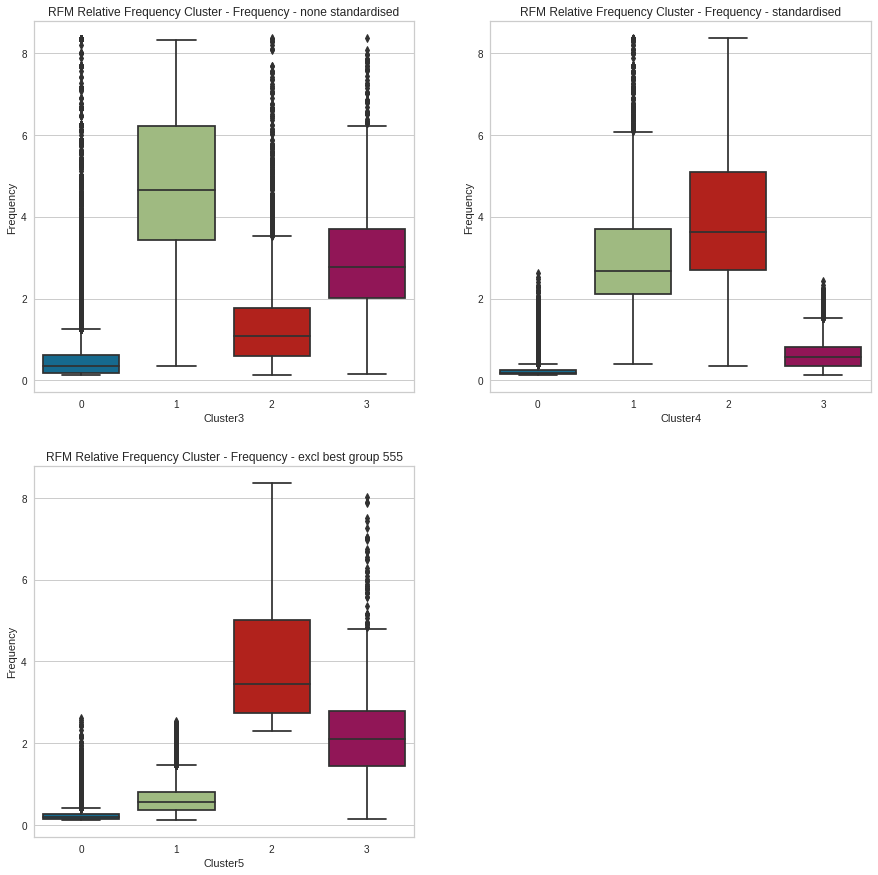

In [157]:
# use relative freequency model
plt.figure(figsize=(15,15))
plt.subplot(221)
sns.boxplot(x = 'Cluster3', y='Frequency_rel', data=RFM_rel_res)

plt.ylabel('Frequency')
plt.title('RFM Relative Frequency Cluster - Frequency - none standardised')
# plt.show()

plt.subplot(222)
sns.boxplot(x = 'Cluster4', y='Frequency_rel', data=RFM_rel_res)

plt.ylabel('Frequency')
plt.title('RFM Relative Frequency Cluster - Frequency - standardised')
# plt.show()

plt.subplot(223)
sns.boxplot(x = 'Cluster5', y='Frequency_rel', data=RFM_rel_res5)

plt.ylabel('Frequency')
plt.title('RFM Relative Frequency Cluster - Frequency - excl best group 555')
plt.show();

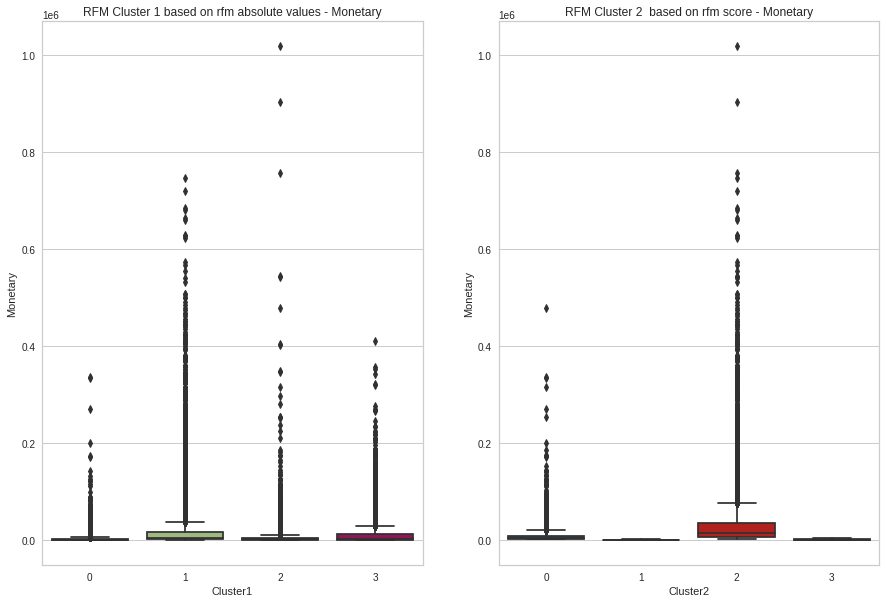

In [158]:
#plt.figure(figsize=(10,10))
#sns.boxplot(x = 'Cluster', y='Monetary', data=RFM_res)

#plt.ylabel('Monetary')
#plt.title('RFM Cluster - Monetary')
#plt.ylim(0,40000)
#plt.show()



plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
sns.boxplot(x = 'Cluster1', y='Monetary', data=RFM_res)

plt.ylabel('Monetary')
plt.title('RFM Cluster 1 based on rfm absolute values - Monetary')
/

plt.subplot(1,2,2)
sns.boxplot(x = 'Cluster2', y='Monetary', data=RFM_res)

plt.ylabel('Monetary')
plt.title('RFM Cluster 2  based on rfm score - Monetary')
plt.show()




**Observation: Cluster 0 spend more money than the others**



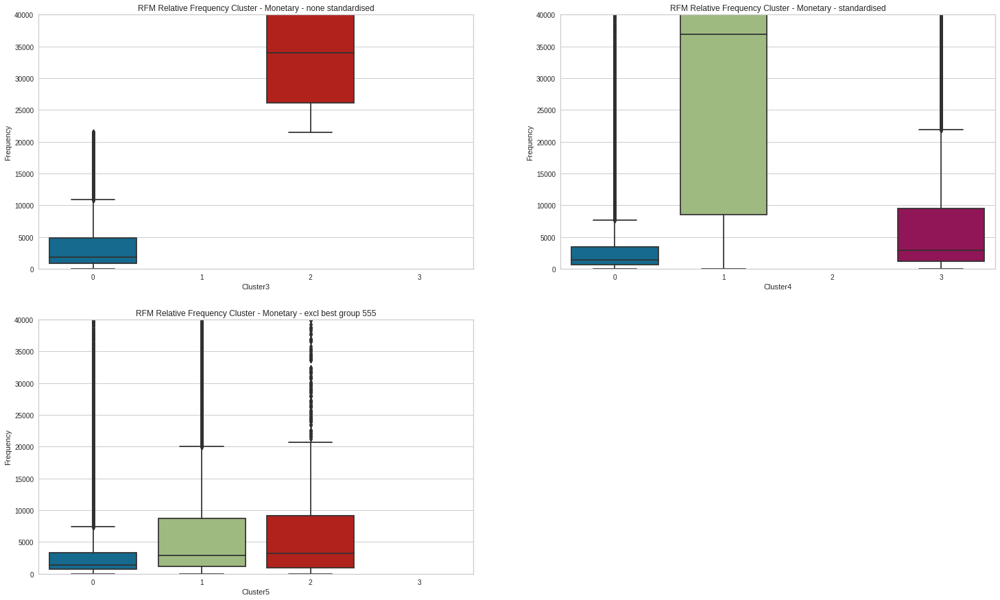

In [163]:
# use relative freequency model
plt.figure(figsize=(25,15))
plt.subplot(221)
sns.boxplot(x = 'Cluster3', y='Monetary', data=RFM_rel_res)
plt.ylim(0,40000)
plt.ylabel('Frequency')
plt.title('RFM Relative Frequency Cluster - Monetary - none standardised')
# plt.show()

plt.subplot(222)
sns.boxplot(x = 'Cluster4', y='Monetary', data=RFM_rel_res)
plt.ylim(0,40000)
plt.ylabel('Frequency')
plt.title('RFM Relative Frequency Cluster - Monetary - standardised')
# plt.show()

plt.subplot(223)
sns.boxplot(x = 'Cluster5', y='Monetary', data=RFM_rel_res5)
plt.ylim(0,40000)
plt.ylabel('Frequency')
plt.title('RFM Relative Frequency Cluster - Monetary - excl best group 555')
plt.show();

**Compare now two variables (RM) and visualize them to show the created clusters**

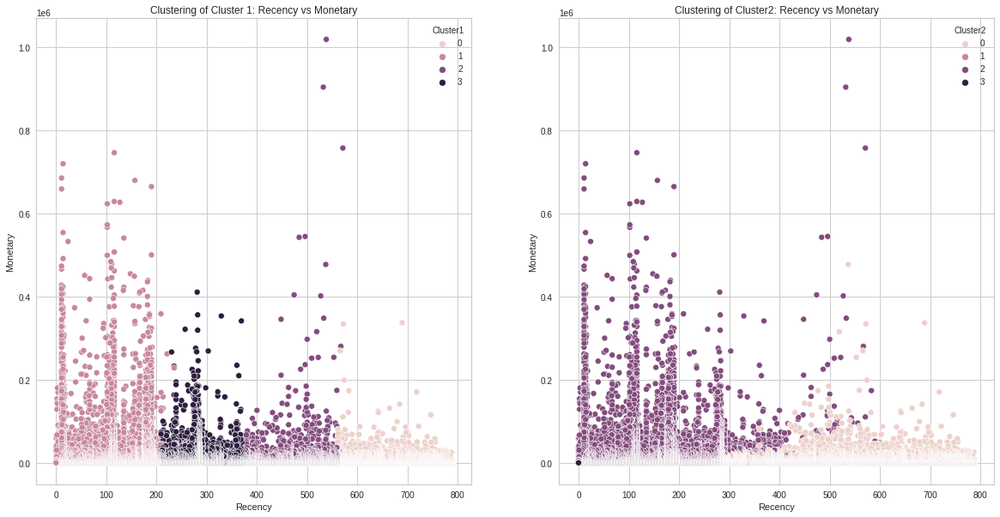

In [164]:
#Model 1 and 2

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)

sns.scatterplot(RFM_res['Recency'], RFM_res['Monetary'], hue=RFM_res['Cluster1'])
plt.title('Clustering of Cluster 1: Recency vs Monetary')


plt.subplot(1,2,2)
sns.scatterplot(RFM_res['Recency'], RFM_res['Monetary'], hue=RFM_res['Cluster2'])
plt.title('Clustering of Cluster2: Recency vs Monetary')

plt.show()

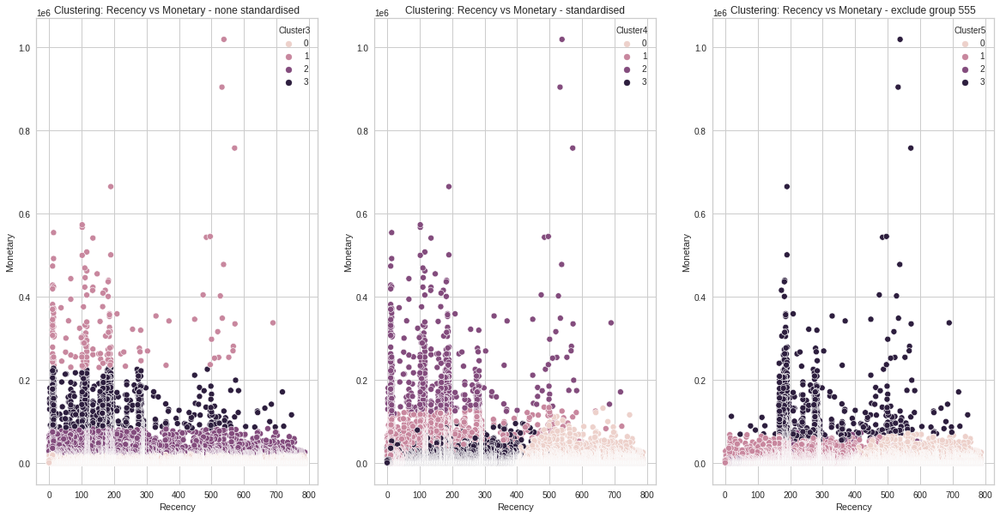

In [169]:
# model 3 & model 4 & model 5
plt.figure(figsize=(20,10))
plt.subplot(131)
sns.scatterplot(RFM_rel_res['Recency'], RFM_rel_res['Monetary'], hue=RFM_rel_res['Cluster3'])
plt.title('Clustering: Recency vs Monetary - none standardised')

plt.subplot(132)
sns.scatterplot(RFM_rel_res['Recency'], RFM_rel_res['Monetary'], hue=RFM_rel_res['Cluster4'])
plt.title('Clustering: Recency vs Monetary - standardised')

plt.subplot(133)
sns.scatterplot(RFM_rel_res5['Recency'], RFM_rel_res5['Monetary'], hue=RFM_rel_res5['Cluster5'])
plt.title('Clustering: Recency vs Monetary - exclude group 555')
plt.show()

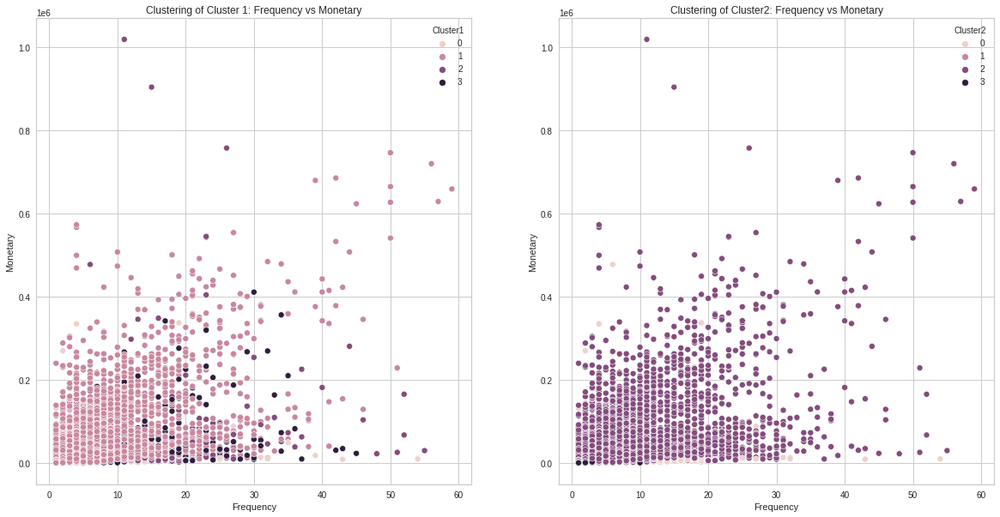

In [170]:
#Model 1 and 2

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)

sns.scatterplot(RFM_res['Frequency'], RFM_res['Monetary'], hue=RFM_res['Cluster1'])
plt.title('Clustering of Cluster 1: Frequency vs Monetary')


plt.subplot(1,2,2)
sns.scatterplot(RFM_res['Frequency'], RFM_res['Monetary'], hue=RFM_res['Cluster2'])
plt.title('Clustering of Cluster2: Frequency vs Monetary')

plt.show()


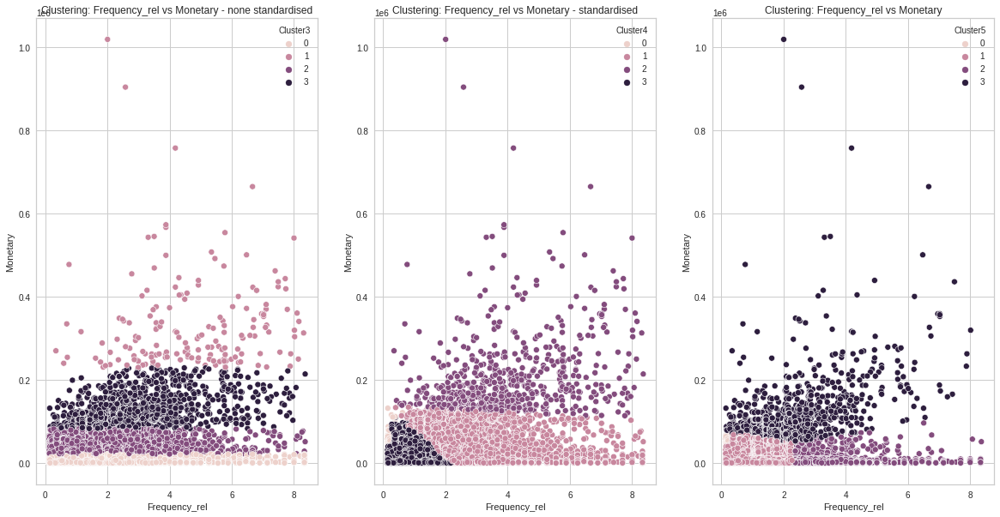

In [171]:
# model 3 & model 4 & model 5
plt.figure(figsize=(20,10))
plt.subplot(131)
sns.scatterplot(RFM_rel_res['Frequency_rel'], RFM_rel_res['Monetary'], hue=RFM_rel_res['Cluster3'])
plt.title('Clustering: Frequency_rel vs Monetary - none standardised')

plt.subplot(132)
sns.scatterplot(RFM_rel_res['Frequency_rel'], RFM_rel_res['Monetary'], hue=RFM_rel_res['Cluster4'])
plt.title('Clustering: Frequency_rel vs Monetary - standardised')

plt.subplot(133)
sns.scatterplot(RFM_rel_res5['Frequency_rel'], RFM_rel_res5['Monetary'], hue=RFM_rel_res5['Cluster5'])
plt.title('Clustering: Frequency_rel vs Monetary')
plt.show()

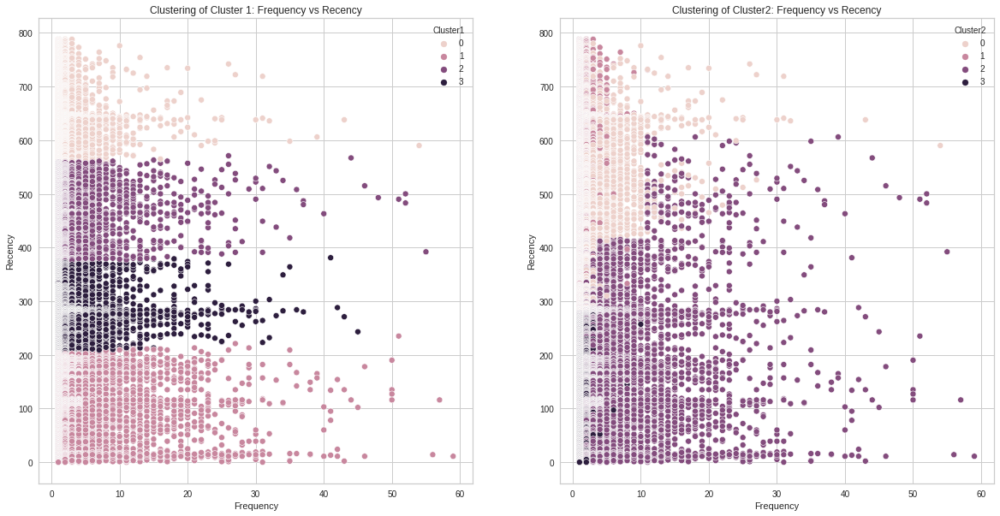

In [172]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)

sns.scatterplot(RFM_res['Frequency'], RFM_res['Recency'], hue=RFM_res['Cluster1'])
plt.title('Clustering of Cluster 1: Frequency vs Recency')


plt.subplot(1,2,2)
sns.scatterplot(RFM_res['Frequency'], RFM_res['Recency'], hue=RFM_res['Cluster2'])
plt.title('Clustering of Cluster2: Frequency vs Recency')

plt.show()





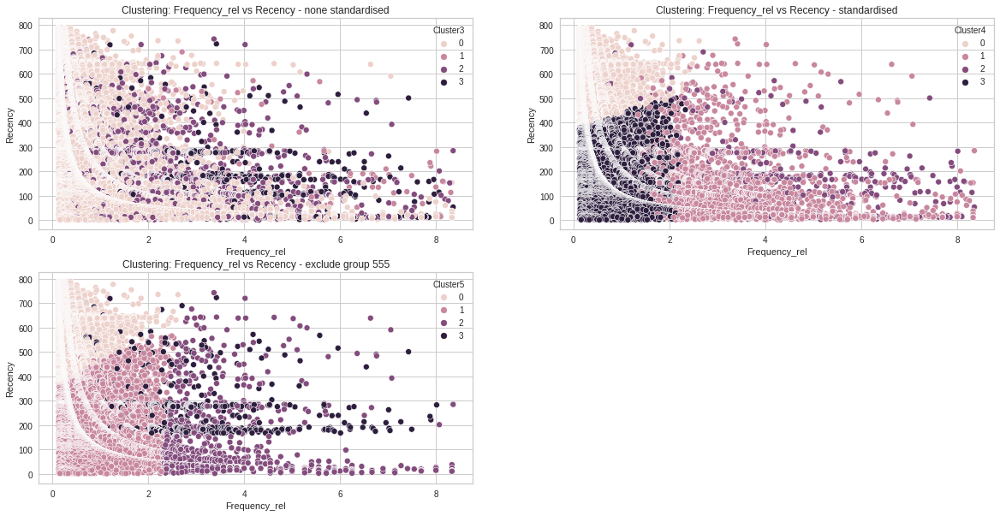

In [174]:
# model 3 & model 4 & model 5
plt.figure(figsize=(20,10))
plt.subplot(221)
sns.scatterplot(RFM_rel_res['Frequency_rel'], RFM_rel_res['Recency'], hue=RFM_rel_res['Cluster3'])
plt.title('Clustering: Frequency_rel vs Recency - none standardised')

plt.subplot(222)
sns.scatterplot(RFM_rel_res['Frequency_rel'], RFM_rel_res['Recency'], hue=RFM_rel_res['Cluster4'])
plt.title('Clustering: Frequency_rel vs Recency - standardised')

plt.subplot(223)
sns.scatterplot(RFM_rel_res5['Frequency_rel'], RFM_rel_res5['Recency'], hue=RFM_rel_res5['Cluster5'])
plt.title('Clustering: Frequency_rel vs Recency - exclude group 555')
plt.show()

**3D representation of segmented customers**

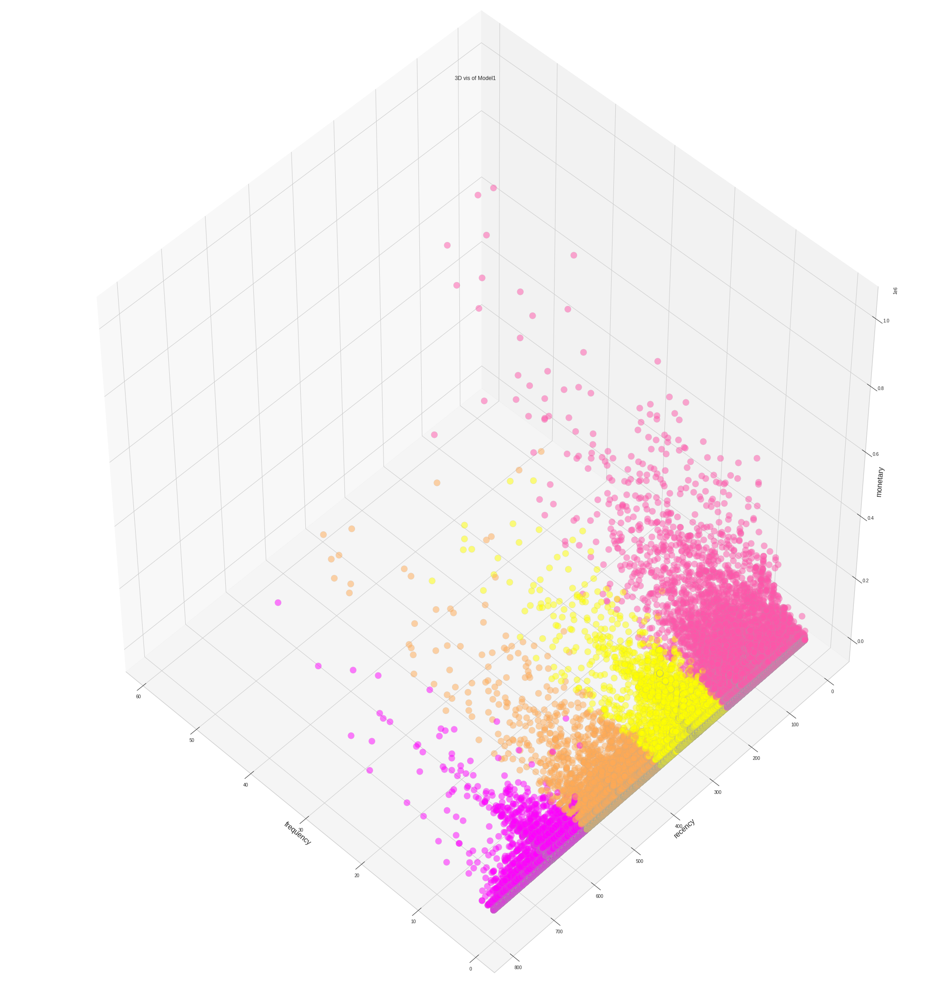

In [175]:
#Plot a 3D model
import mpl_toolkits as mpltk

plt.rcParams['figure.figsize'] = (30,30)
fig = plt.figure(1)
plt.clf()

ax = mpltk.mplot3d.Axes3D(fig, 
            rect = [0,0,.95,1],
            elev = 48,
            azim = 134)
plt.cla()
ax.scatter(RFM_res['Frequency'], RFM_res['Recency'], RFM_res['Monetary'],
           c = RFM_res['Cluster1'],
           s = 200,
           cmap='spring',
           alpha = 0.5,
           edgecolor = 'darkgrey')

ax.set_xlabel('frequency', fontsize=16)
ax.set_ylabel('recency', fontsize=16)
ax.set_zlabel('monetary', fontsize=16)
plt.title('3D vis of Model1')
plt.show()


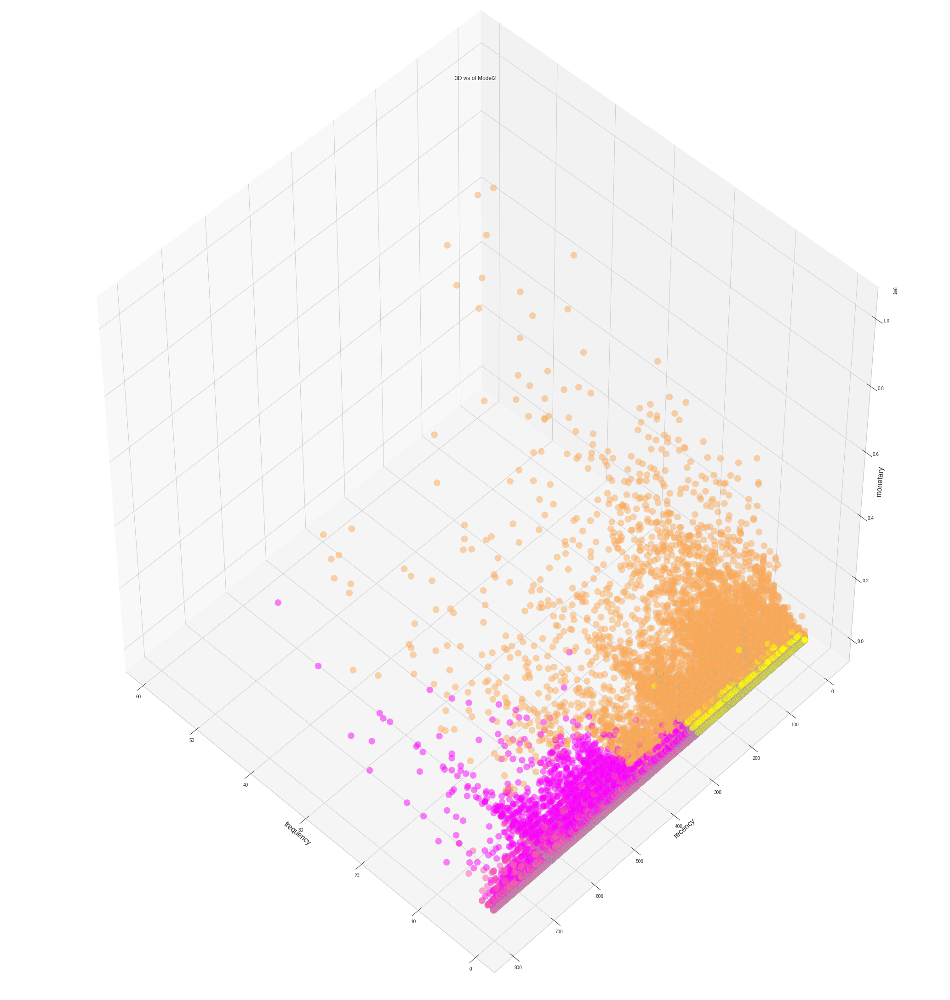

In [176]:
plt.rcParams['figure.figsize'] = (30,30)
fig = plt.figure(1)
plt.clf()

ax = mpltk.mplot3d.Axes3D(fig, 
            rect = [0,0,.95,1],
            elev = 48,
            azim = 134)
plt.cla()
ax.scatter(RFM_res['Frequency'], RFM_res['Recency'], RFM_res['Monetary'],
           c = RFM_res['Cluster2'],
           s = 200,
           cmap='spring',
           alpha = 0.5,
           edgecolor = 'darkgrey')

ax.set_xlabel('frequency', fontsize=16)
ax.set_ylabel('recency', fontsize=16)
ax.set_zlabel('monetary', fontsize=16)
plt.title('3D vis of Model2')
plt.show()

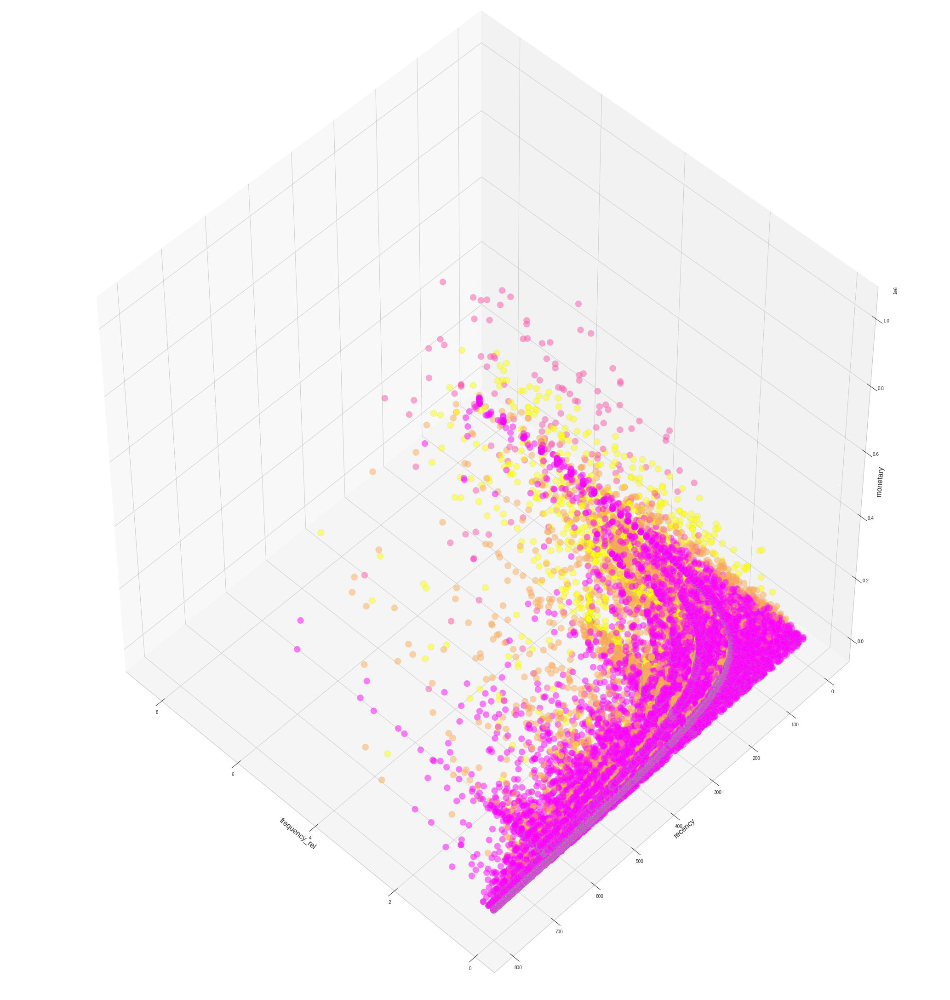

In [177]:
#Plot a 3D model for model 3
import mpl_toolkits as mpltk

plt.rcParams['figure.figsize'] = (30,30)
fig = plt.figure(1)
plt.clf()

ax = mpltk.mplot3d.Axes3D(fig, 
            rect = [0,0,.95,1],
            elev = 48,
            azim = 134)
plt.cla()
ax.scatter(RFM_rel_res['Frequency_rel'], RFM_rel_res['Recency'], RFM_rel_res['Monetary'],
           c = RFM_rel_res['Cluster3'],
           s = 200,
           cmap='spring',
           alpha = 0.5,
           edgecolor = 'darkgrey')

ax.set_xlabel('frequency_rel', fontsize=16)
ax.set_ylabel('recency', fontsize=16)
ax.set_zlabel('monetary', fontsize=16)
plt.show()

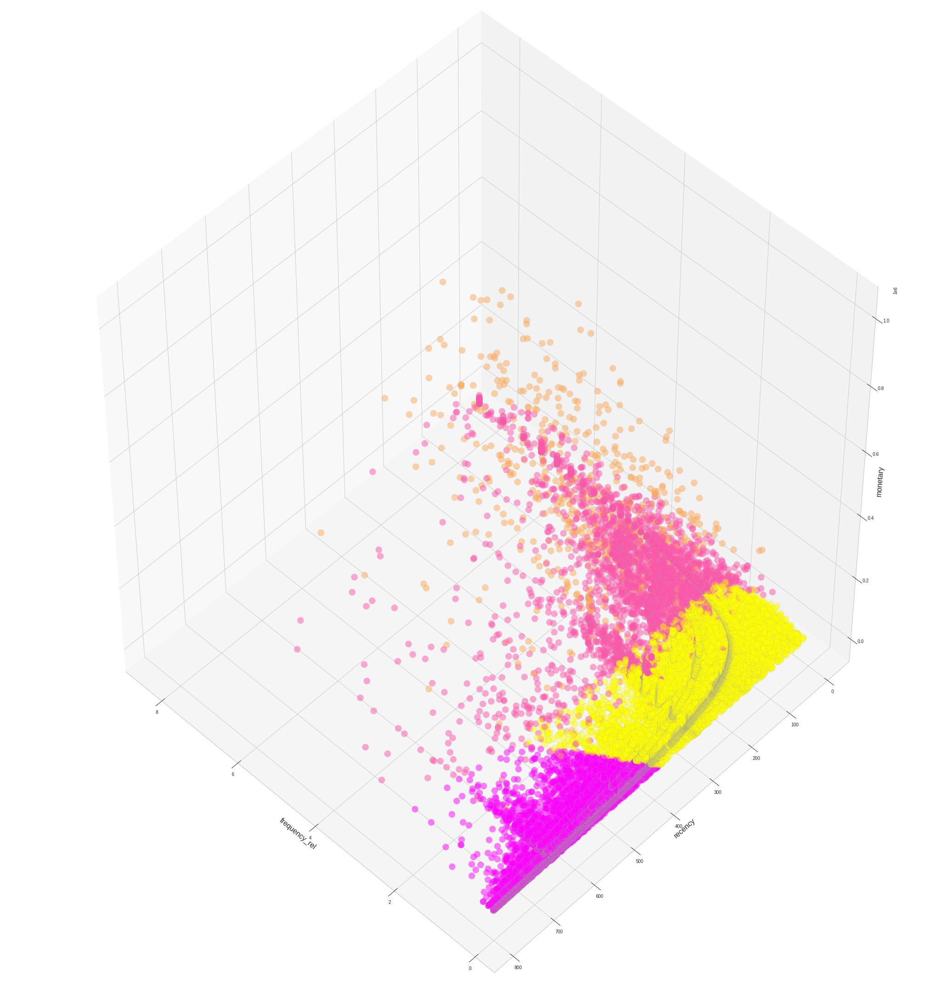

In [178]:
#Plot a 3D model for model 4
import mpl_toolkits as mpltk

plt.rcParams['figure.figsize'] = (30,30)
fig = plt.figure(1)
plt.clf()

ax = mpltk.mplot3d.Axes3D(fig, 
            rect = [0,0,.95,1],
            elev = 48,
            azim = 134)
plt.cla()
ax.scatter(RFM_rel_res['Frequency_rel'], RFM_rel_res['Recency'], RFM_rel_res['Monetary'],
           c = RFM_rel_res['Cluster4'],
           s = 200,
           cmap='spring',
           alpha = 0.5,
           edgecolor = 'darkgrey')

ax.set_xlabel('frequency_rel', fontsize=16)
ax.set_ylabel('recency', fontsize=16)
ax.set_zlabel('monetary', fontsize=16)
plt.show()

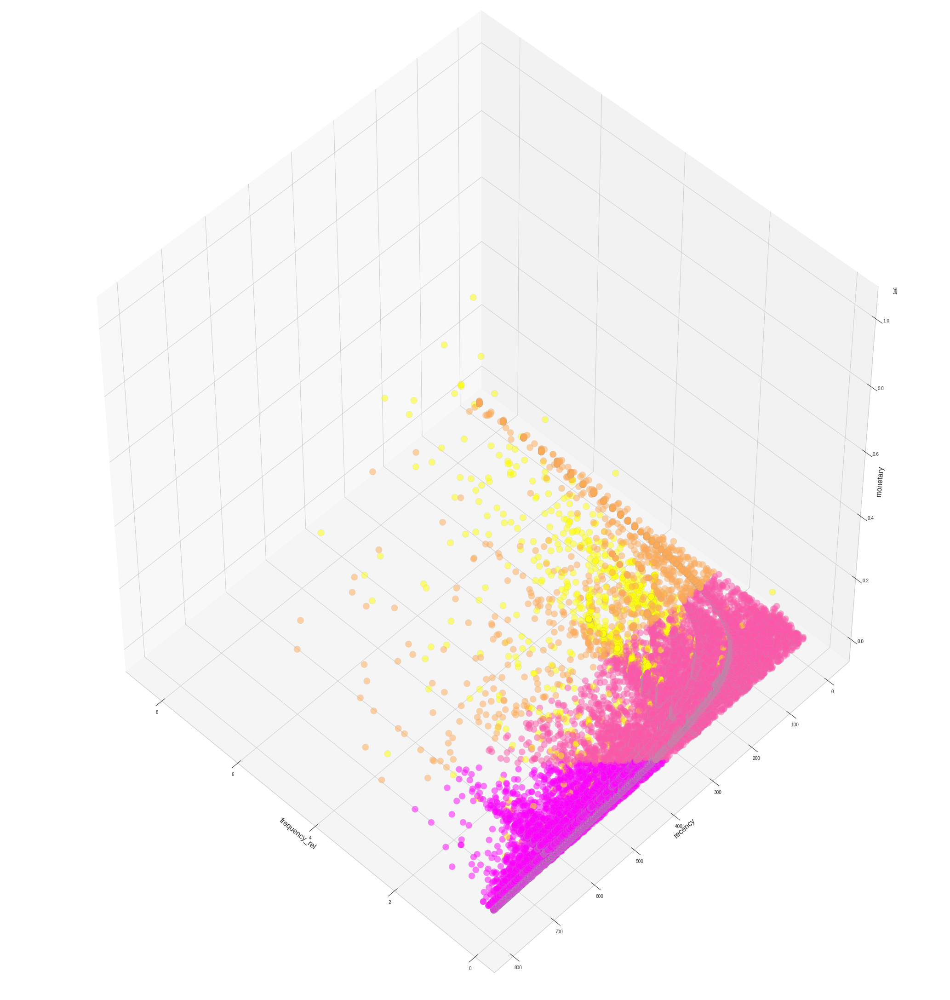

In [179]:
#Plot a 3D model for model 5
import mpl_toolkits as mpltk

plt.rcParams['figure.figsize'] = (30,30)
fig = plt.figure(1)
plt.clf()

ax = mpltk.mplot3d.Axes3D(fig, 
            rect = [0,0,.95,1],
            elev = 48,
            azim = 134)
plt.cla()
ax.scatter(RFM_rel_res5['Frequency_rel'], RFM_rel_res5['Recency'], RFM_rel_res5['Monetary'],
           c = RFM_rel_res5['Cluster5'],
           s = 200,
           cmap='spring',
           alpha = 0.5,
           edgecolor = 'darkgrey')

ax.set_xlabel('frequency_rel', fontsize=16)
ax.set_ylabel('recency', fontsize=16)
ax.set_zlabel('monetary', fontsize=16)
plt.show()